In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import seaborn as sns
import numpy as np

import scanpy as sc
import scipy
import warnings
from tqdm.notebook import tqdm
import pickle as pkl
from matplotlib.patches import Polygon

import matplotlib as mpl
import seaborn as sns

In [2]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## Reading in Data

In [3]:
###use Yutong's decontamation v2 

In [4]:
#adata = sc.read_csv('/Users/derekbogdanoff/projects/XYZeq/decont_mat//decont_mat_after_v1.csv').T
adata = sc.read_csv('/Users/derekbogdanoff/projects/XYZeq/decont_mat/decont_mat_after_v2.csv').T

In [13]:
adata.obs['batch'] = adata.obs.index.str[:4]

In [16]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)

adata.obs['log_counts'] = np.log(adata.obs['n_counts'])

adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [17]:
adata.obs['barcode'] = adata.obs.index.str[-18:-2]

In [18]:
adata.var_names_make_unique()

In [19]:
#sc.pl.highest_expr_genes(adata, n_top=100) 

In [20]:
mito_genes_mouse=[name for name in adata.var_names if name.startswith(('mm10_mt-'))]
                                                              
mito_genes_human=[name for name in adata.var_names if name.startswith(('hg19_MT-'))] 

adata.obs['percent_mito_mouse'] = np.sum(adata[:, mito_genes_mouse].X, axis=1) / np.sum(adata.X, axis=1)*100

adata.obs['percent_mito_human'] = np.sum(adata[:, mito_genes_human].X, axis=1) / np.sum(adata.X, axis=1)*100

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [21]:
#sc.pp.filter_cells(adata, min_counts = 500)

In [22]:
#sc.pp.filter_cells(adata, min_genes = 100)

In [23]:
#sc.pp.filter_genes(adata, min_cells=1)

In [24]:
#adata = adata[adata.obs['n_counts'] < 10000, :]

In [25]:
#data = adata[adata.obs['percent_mito_mouse'] < 1, :]

In [26]:
adata.obs.batch.value_counts()

L20C    4788
L20T    2950
L30C    1716
L10C     826
Name: batch, dtype: int64

In [27]:
####call cell species

mouse_genes=[name for name in adata.var_names if name.startswith('mm10_')]

#mouse_genes=[name for name in adata.var_names if name.startswith('mm10___')]
#human_genes=[name for name in adata.var_names if name.startswith('GRCh38_')]

human_genes=[name for name in adata.var_names if name.startswith('hg19_')]


adata.obs['mouse_counts'] = np.sum(adata[:, mouse_genes].X, axis=1)
adata.obs['human_counts'] = np.sum(adata[:, human_genes].X, axis=1)

In [28]:
cmap = mpl.colors.ListedColormap(['royalblue','lightgrey', 'orangered'])

np.seterr(divide = 'ignore') 
adata.obs['ratio'] = np.log10(np.true_divide(adata.obs['mouse_counts'], adata.obs['human_counts']))


def cell_call(counts):
        if counts['ratio'] > 0.66:
                return 'M'
        elif counts['ratio'] < -0.66:
                return 'H'
        else:
                return 'C'

         
adata.obs['cell_call']=adata.obs.apply(lambda counts: cell_call(counts), axis=1)



In [19]:
adata

AnnData object with n_obs × n_vars = 10280 × 55287
    obs: 'batch', 'n_counts', 'log_counts', 'n_genes', 'barcode', 'percent_mito_mouse', 'percent_mito_human', 'mouse_counts', 'human_counts', 'ratio', 'cell_call'

In [29]:
contam_init = pd.read_csv('/Users/derekbogdanoff/projects/XYZeq/contamination_analysis/est_contam_before.csv',
                    index_col=0)
contam_post = pd.read_csv('/Users/derekbogdanoff/projects/XYZeq/contamination_analysis/est_contam_after.csv',
                    index_col=0)

In [30]:
contam_init.cell_iden.replace({'\.':'-'}, regex=True)
contam_post.cell_iden.replace({'\.':'-'}, regex=True)

1         L10C-P1A01F-TCTCAGCTGCTTCTCC-0
2         L10C-P1A01F-CACTGGCGGTATTAGA-0
3         L10C-P1A01F-CCTTGTACAGGCATGA-0
4         L10C-P1A01F-CACGACCTCACGACTA-0
5         L10C-P1A01F-AGTAGAGTTATCGTCC-0
                      ...               
10272    L30C8-P4H08F-TATGCAGGTTCACTGT-4
10273    L30C8-P4H08F-CTGCTTCGGCCATCAG-4
10274    L30C8-P4H09F-CGTATTCTCTACTGAC-4
10275    L30C8-P4H10F-ATGGCAAGGTTCTATG-4
10276    L30C8-P4H12F-TAGGATTCCGGAACAC-4
Name: cell_iden, Length: 10276, dtype: object

In [35]:
contam_init.columns = ['cell_iden','CellType','contam']
contam_init.index=contam_init.cell_iden

contam_post.columns = ['cell_iden','CellType','contam']
contam_post.index=contam_post.cell_iden

In [84]:
adata.obs['contam_init']=contam_init.contam
adata.obs['contam_post']=contam_post.contam

# Fitler out human cells and mixed species

In [37]:


adata_m = adata[adata.obs.cell_call == 'M']

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [40]:
adata_m.raw = sc.pp.log1p(adata_m, copy=True)

In [41]:
sc.pp.normalize_per_cell(adata_m, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:06): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


extracting highly variable genes
    finished (0:00:02)


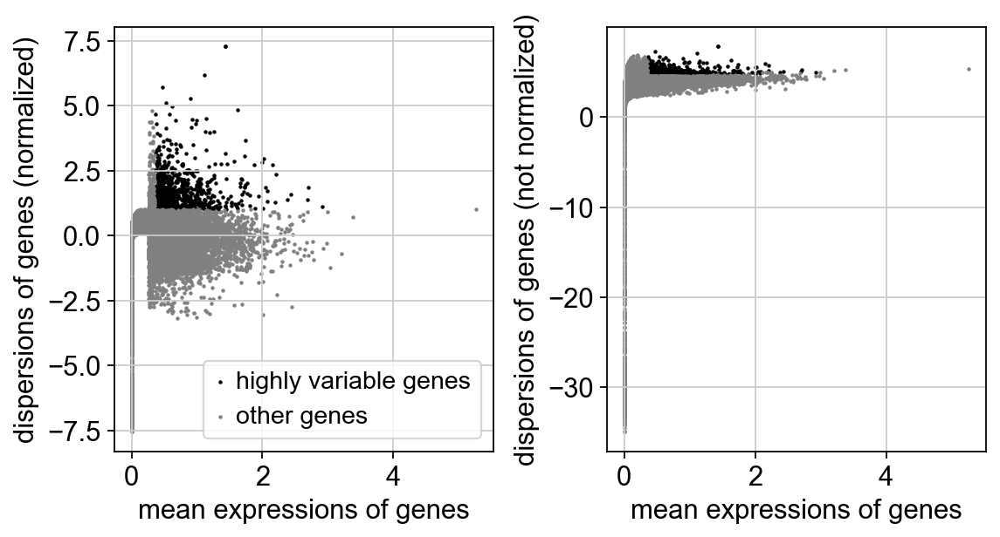

In [42]:
filter_result = sc.pp.filter_genes_dispersion(
    adata_m.X,
#      n_top_genes=2000
    min_mean=0.35,
    max_mean=7,
    min_disp=1,

                                            ) 


####L20C1 parameters 

sc.pl.filter_genes_dispersion(filter_result)

In [43]:
genes = pd.DataFrame.from_records(filter_result)

In [44]:
genes['name'] = adata.var_names.to_series().reset_index()['index']

<AxesSubplot:xlabel='means', ylabel='dispersions_norm'>

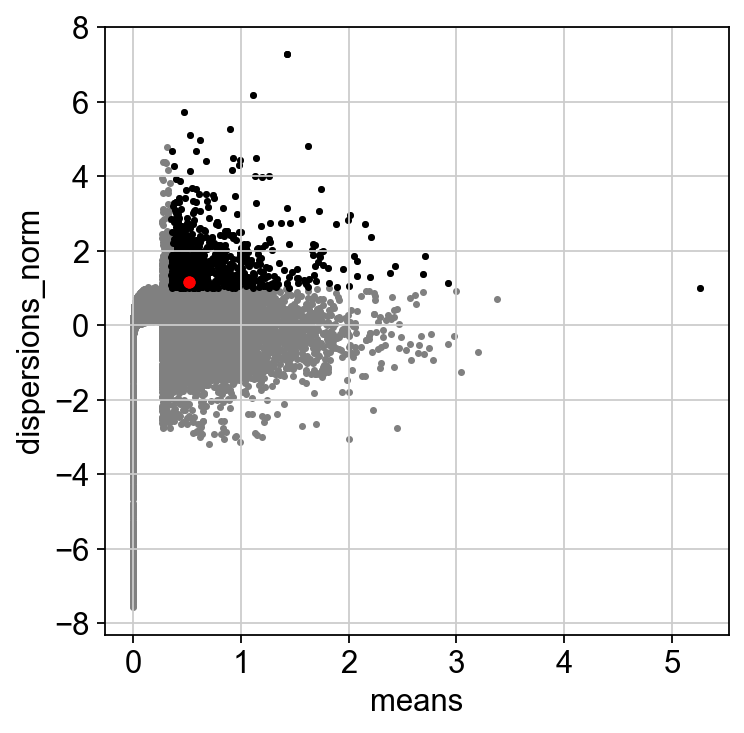

In [45]:


plt.rcParams['figure.figsize'] = 5,5

sns.scatterplot(data=genes,
               x='means',
               y='dispersions_norm',
               color='grey',
                s=10,
                linewidth=0
               )

sns.scatterplot(data=genes[genes.eval("means < 7 & means >= 0.35 & dispersions_norm >= 1")],
               x='means',
               y='dispersions_norm',
               color='Black',
               s=10,
                linewidth=0
               )


sns.scatterplot(data=genes[genes.name.str.startswith('mm10_Smim20')],
               x='means',
               y='dispersions_norm',
               color='Red',
               s=30,
                linewidth=0
               )

In [46]:
genes[genes.name == 'mm10_Smim20']

,gene_subset,means,dispersions,dispersions_norm,name
38302,True,0.521883,4.643019,1.151627,mm10_Smim20


In [47]:
adata_m = adata_m[:, filter_result.gene_subset]

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [48]:
sc.pp.log1p(adata_m)

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [49]:
#Regress out unwanted sources of variation
sc.pp.regress_out(adata_m, ['n_counts',
#                           'percent_mito_human',
                           'percent_mito_mouse',
#                          'contam_init'
                         ])

regressing out ['n_counts', 'percent_mito_mouse']


/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'batch' as categorical
... storing 'barcode' as categorical
... storing 'cell_call' as categorical


    finished (0:00:05)


In [50]:
sc.pp.scale(adata_m, max_value=10)

In [51]:
sc.tl.pca(adata_m,
          svd_solver='arpack'
         )

computing PCA
    with n_comps=50
    finished (0:00:00)


In [52]:
sc.tl.tsne(adata_m,
           n_pcs=13,
        #    early_exaggeration=10
          )
sc.tl.embedding_density(adata_m, basis='tsne')

computing tSNE
    using 'X_pca' with n_pcs = 13
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:31)
computing density on 'tsne'
--> added
    'tsne_density', densities (adata.obs)
    'tsne_density_params', parameter (adata.uns)


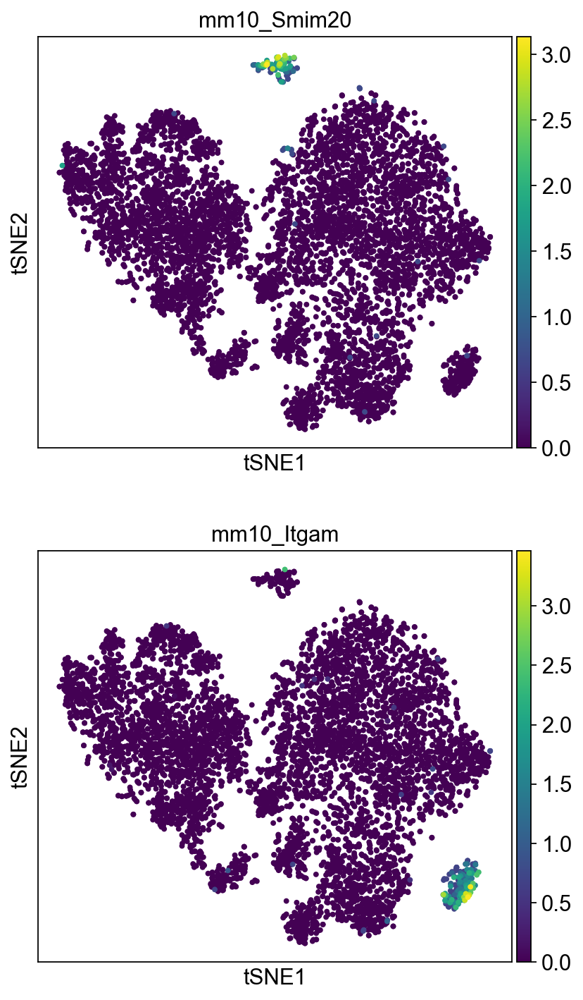

In [53]:
plt.rcParams['figure.figsize'] = [5, 5]

sc.pl.tsne(adata_m,
           color=['mm10_Smim20','mm10_Itgam'],
           ncols=1,
           palette='tab10',
           size=50
          )

In [54]:
sc.pp.neighbors(adata_m, 
                n_neighbors=10,
                n_pcs=15)

computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [55]:
sc.tl.leiden(adata_m, resolution=0.6)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [62]:
adata_m.uns['batch_colors']=[
    '#bcbddc', #light blue
    '#74c476', #green
    '#e6550d', #red
    '#3182bd' #blue
]

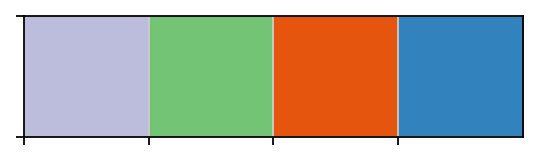

In [63]:
sns.palplot(adata_m.uns['batch_colors'])

In [64]:
adata_m.uns['batch_colors']

['#bcbddc', '#74c476', '#e6550d', '#3182bd']

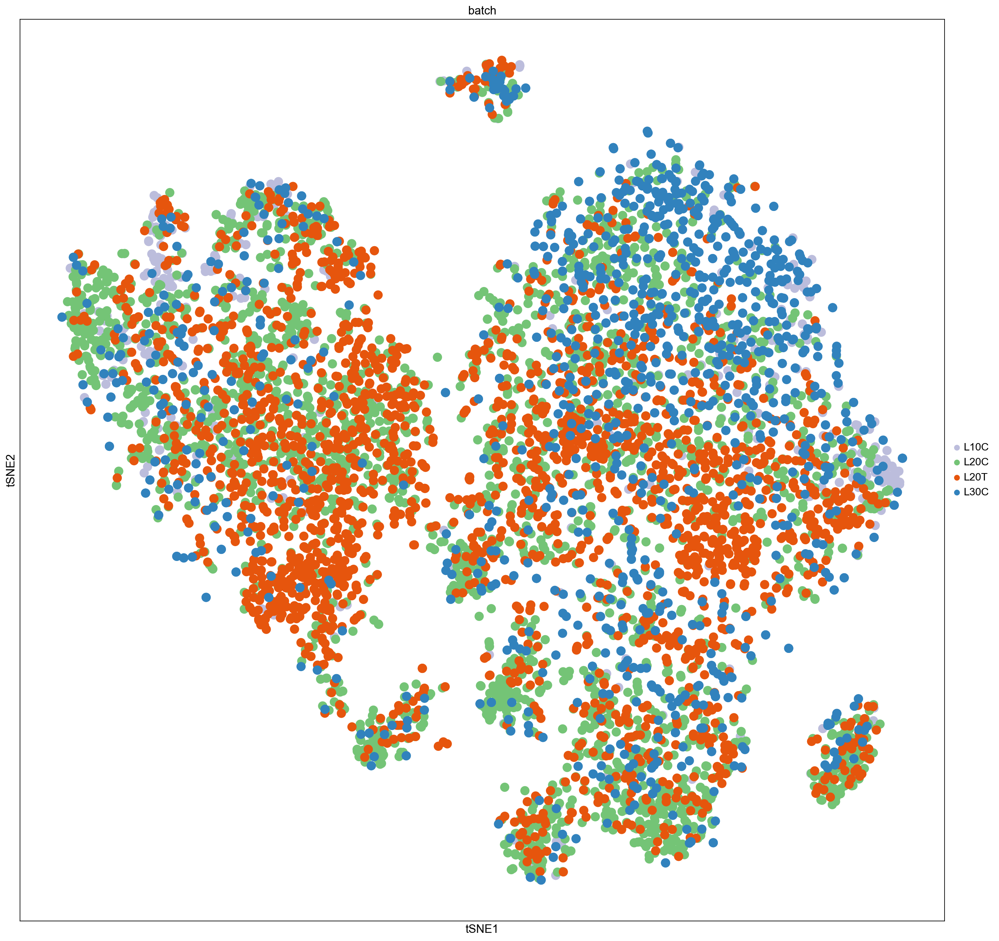

In [65]:
plt.rcParams['figure.figsize'] = [20, 20]



sc.pl.tsne(adata_m,
          color=['batch',
                ]
           ,

           ncols=2,
            size=500
          )

In [66]:
sc.tl.umap(adata_m,          
             min_dist=.5,
             spread=5,
             alpha=5,
            )
#sc.tl.embedding_density(adata_m, basis='umap')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


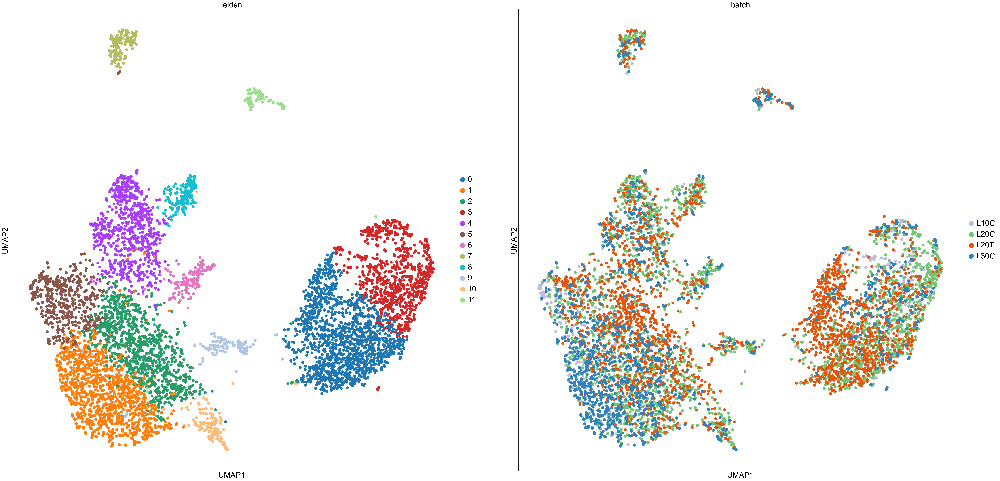

In [67]:
plt.rcParams['figure.figsize'] = [32, 32]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30

sc.pl.umap(adata_m, 
           color=['leiden',
           'batch'],
           ncols=2,
     #      palette='tab20c_r',
           color_map=cmap,
      #     legend_loc='on data',
           size=500)

In [68]:
sc.tl.rank_genes_groups(adata_m,groupby='leiden')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:29)


In [200]:
sc.pl.rank_genes_groups(
                        adata_m,
                       fontsize=40,
                       ncols=2
                        )



In [69]:
cell_type_df=pd.DataFrame(adata_m.obs['leiden'])

def label (row):
   if row['leiden'] == '0':
      return 'Hepatocyte'
   if row['leiden'] =='1':
      return 'mc38'
   if row['leiden'] == '2':
      return 'mc38'
   if row['leiden'] == '3':
      return 'Hepatocyte'
   if row['leiden']  == '4':
      return 'Myeloid'
   if row['leiden'] == '5':
      return 'mc38'
   if row['leiden'] == '6':
      return 'Lymphocyte'
   if row['leiden'] == '7':
      return 'Myeloid'
   if row['leiden'] == '8':
      return 'Kupffer'
   if row['leiden'] == '9':
      return 'LSEC'
   if row['leiden'] == '10': 
      return 'MSC'
   if row['leiden'] == '11':    
      return 'mc38'




    
cell_type_df_ =  pd.DataFrame(cell_type_df.apply (lambda row: label(row), axis=1),)

cell_type_df_.columns=['CellType']

adata_m.obs['CellType']=cell_type_df_

In [70]:
adata_m.uns['CellType_colors']=[
# '#d9d9d9',    #Hek293t   Grey
 '#fb8072', #Hepatocyte   Red
 '#fdb462', #Kupffer   Orange
 '#80b1d3', #LSEC   Blue
 '#bc80bd', #Lymphocyte   Purple 
 '#8dd3c7',#MSC    Cyan 
 '#ccebc5', #Macrophage or Myeloid   Light Green
 '#ffed6f',#mc38    Yellow
# '#8bca80'         dark green
]

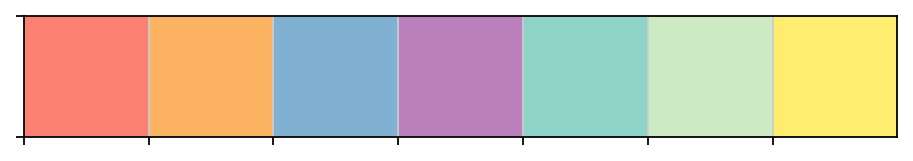

In [71]:
sns.palplot(adata_m.uns['CellType_colors'])

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'CellType' as categorical


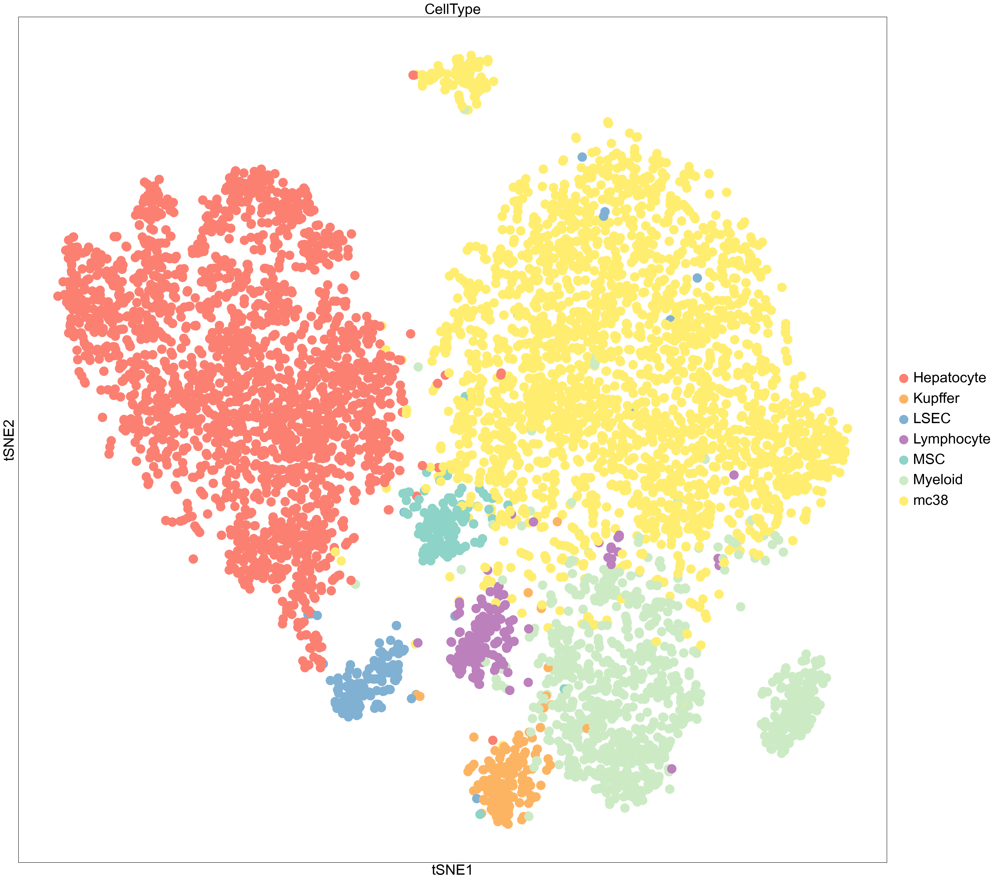

In [72]:
plt.rcParams['figure.figsize'] = [32, 32]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30
sc.pl.tsne(adata_m,
          color='CellType',
    
           ncols=1,
           size=1500,
         #  legend_loc='on data',
         #  save='liver_Mouse_pnly_CellType_tsne.svg'
          )

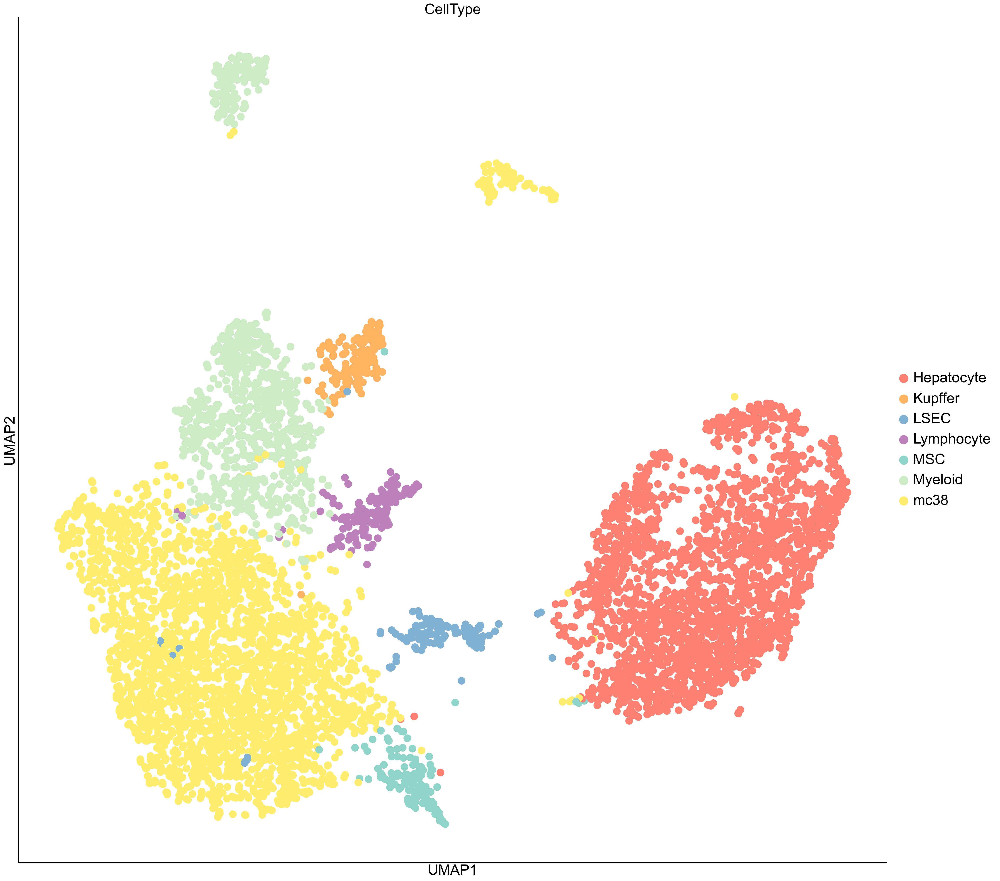

In [73]:
plt.rcParams['figure.figsize'] = [32, 32]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30
sc.pl.umap(adata_m,
          color='CellType',
           color_map='viridis',
    
           ncols=1,
           size=1000,
           save='liver_Mouse_pnly_Batch_umap.svg',
          )

In [74]:
sc.tl.rank_genes_groups(adata_m,
                        groupby='CellType',
                        method='wilcoxon')

sc.tl.filter_rank_genes_groups(adata_m,
                              min_fold_change=1.5)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:38)
Filtering genes using: min_in_group_fraction: 0.25 min_fold_change: 1.5, max_out_group_fraction: 0.5


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_CellType']`


Trying to set attribute `.uns` of view, copying.


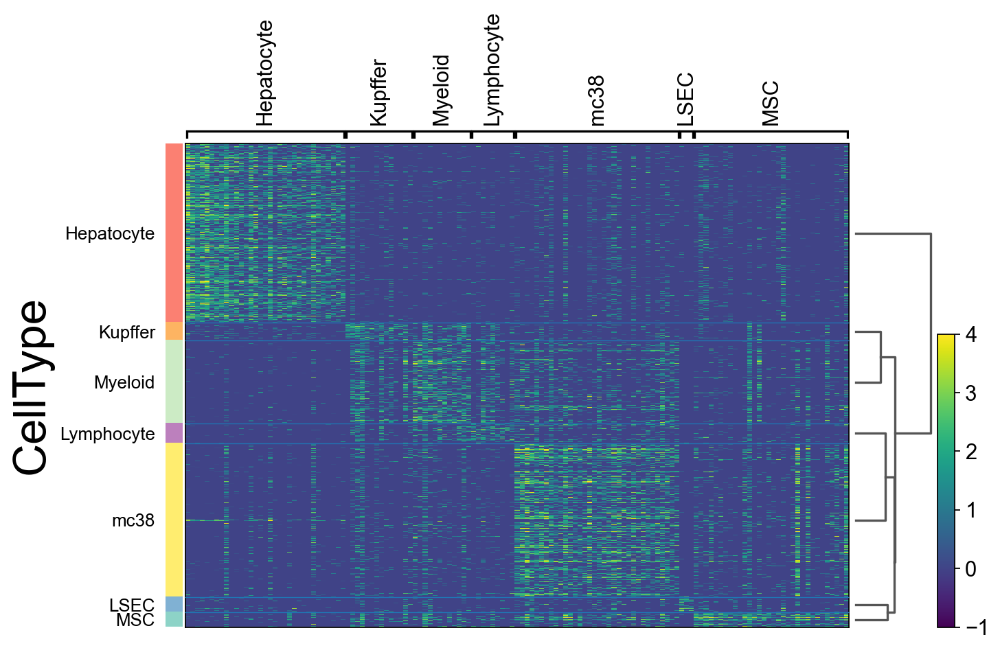

In [76]:
plt.rcParams['figure.figsize'] = 40,40

sc.pl.rank_genes_groups_heatmap(adata_m[adata_m.obs.batch == 'L20C'],
                                swap_axes=False,
                                key='rank_genes_groups_filtered',
                                n_genes=200,
                                 vmax=4,
                                 vmin=-1,
                                cmap='viridis',
                                dendrogram=True,
                                #save='liver_Mouse_only_CellType_heatmap.svg'
                                
                                
                               )

In [63]:
#adata_m.write_h5ad('../../../../new_h5s/Processed_Liver_All_Batches_mouse_deconV2.h5ad')

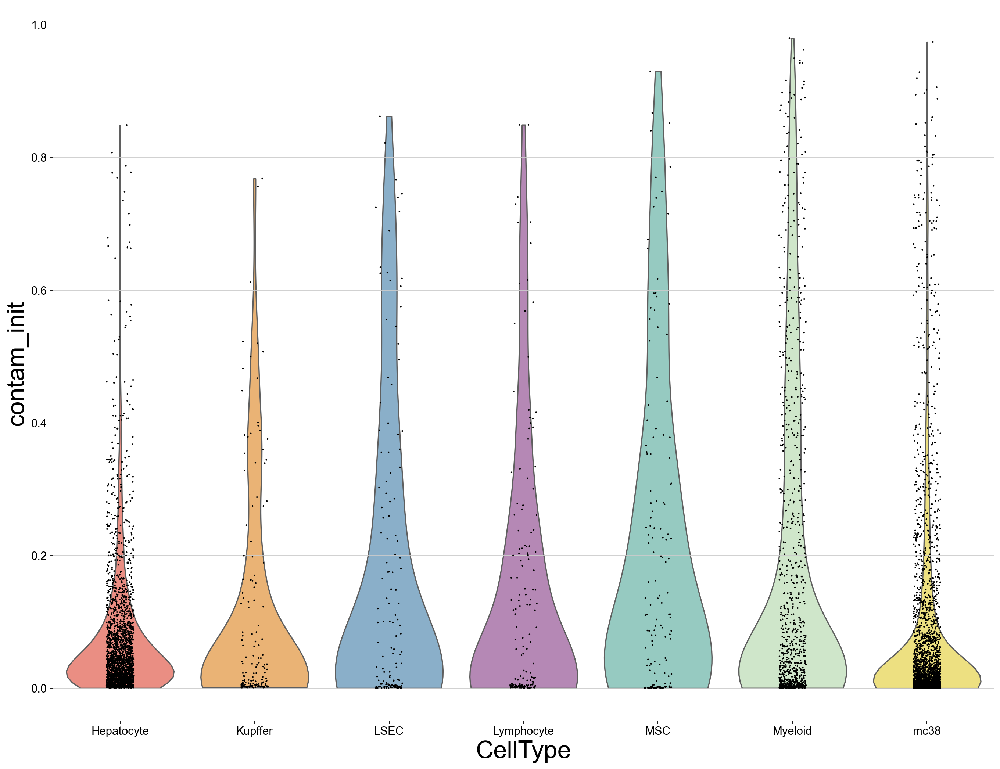

In [85]:
plt.rcParams['figure.figsize'] = [16, 16]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30

sc.pl.violin(adata_m,
            keys='contam_init',
            groupby='CellType',
            size=2,
            #save='liver_CONTAMINATIONviolin.svg'
            )

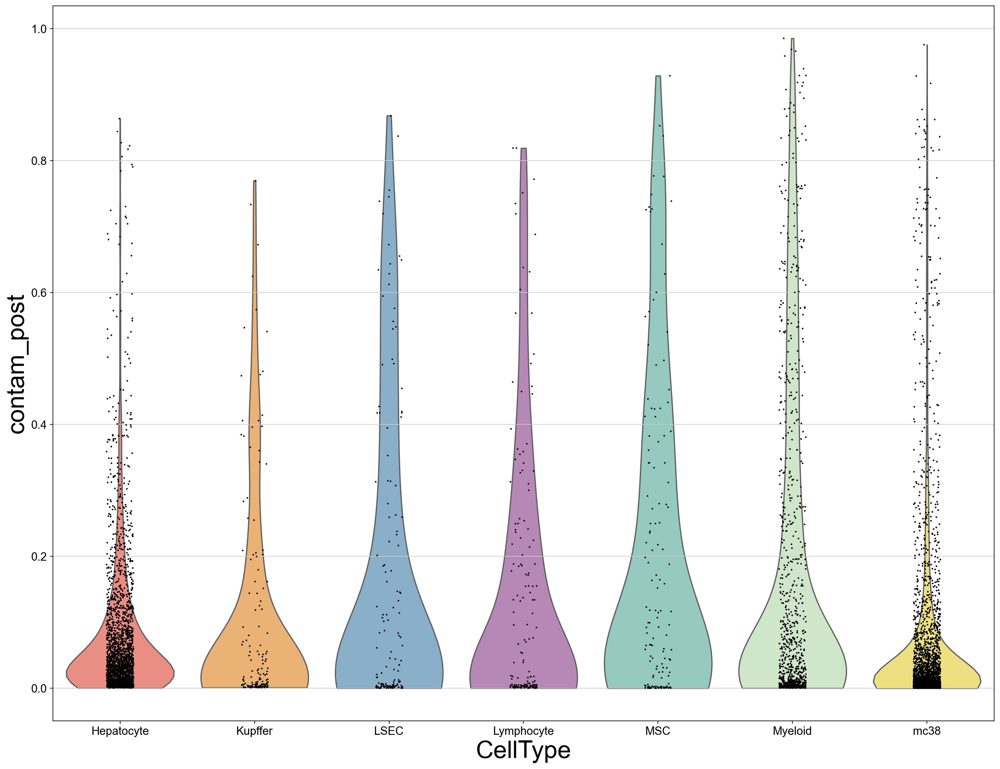

In [86]:
plt.rcParams['figure.figsize'] = [16, 16]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30

sc.pl.violin(adata_m,
            keys='contam_post',
            groupby='CellType',
            size=2,
            #save='liver_CONTAMINATIONviolin.svg'
            )

In [229]:
adata_decon = adata_m[adata_m.obs.contam_init < 0.2]

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [230]:
adata_decon

View of AnnData object with n_obs × n_vars = 5626 × 764
    obs: 'batch', 'n_counts', 'log_counts', 'n_genes', 'barcode', 'percent_mito_mouse', 'percent_mito_human', 'mouse_counts', 'human_counts', 'ratio', 'cell_call', 'contam_init', 'tsne_density', 'leiden', 'CellType', '__is_in_cluster__'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'tsne_density_params', 'neighbors', 'leiden', 'batch_colors', 'umap', 'leiden_colors', 'rank_genes_groups', 'CellType_colors', 'rank_genes_groups_filtered'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [231]:
adata_m.obs.contam_init.median()

0.0290050352527343

In [232]:
5626/6623

0.8494639891287936

In [233]:
adata_decon

View of AnnData object with n_obs × n_vars = 5626 × 764
    obs: 'batch', 'n_counts', 'log_counts', 'n_genes', 'barcode', 'percent_mito_mouse', 'percent_mito_human', 'mouse_counts', 'human_counts', 'ratio', 'cell_call', 'contam_init', 'tsne_density', 'leiden', 'CellType', '__is_in_cluster__'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'tsne_density_params', 'neighbors', 'leiden', 'batch_colors', 'umap', 'leiden_colors', 'rank_genes_groups', 'CellType_colors', 'rank_genes_groups_filtered'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [234]:
sc.tl.tsne(adata_decon,
           n_pcs=13,
        #    early_exaggeration=10
          )
sc.tl.embedding_density(adata_decon, basis='tsne')

computing tSNE
    using 'X_pca' with n_pcs = 13
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:29)
computing density on 'tsne'
--> added
    'tsne_density', densities (adata.obs)
    'tsne_density_params', parameter (adata.uns)


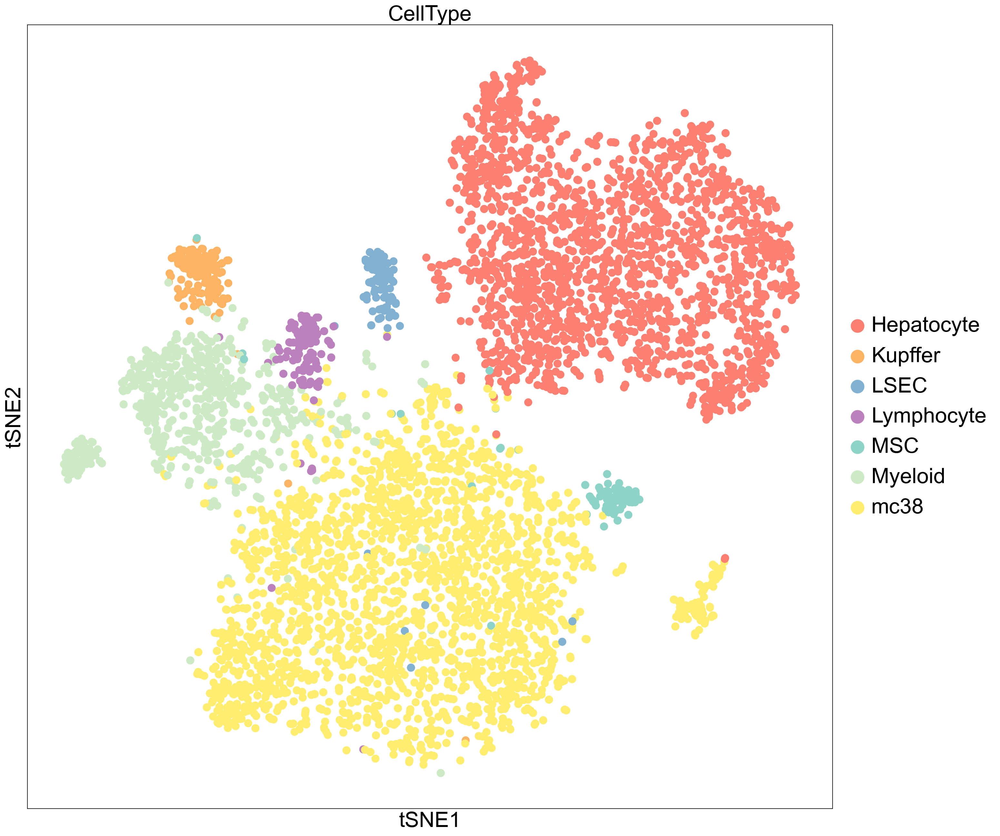

In [235]:
plt.rcParams['figure.figsize'] = [20, 20]



sc.pl.tsne(adata_decon,
          color=['CellType'
                ]
           ,
           ncols=1,
          # palette='tab20c_r',
            size=500
          )

In [236]:
sc.pp.neighbors(adata_decon, 
                n_neighbors=10,
                n_pcs=13)

computing neighbors
    using 'X_pca' with n_pcs = 13
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [237]:
sc.tl.umap(adata_decon,          
             min_dist=.5,
             spread=5,
             alpha=5,
            )
sc.tl.embedding_density(adata_decon, basis='umap')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


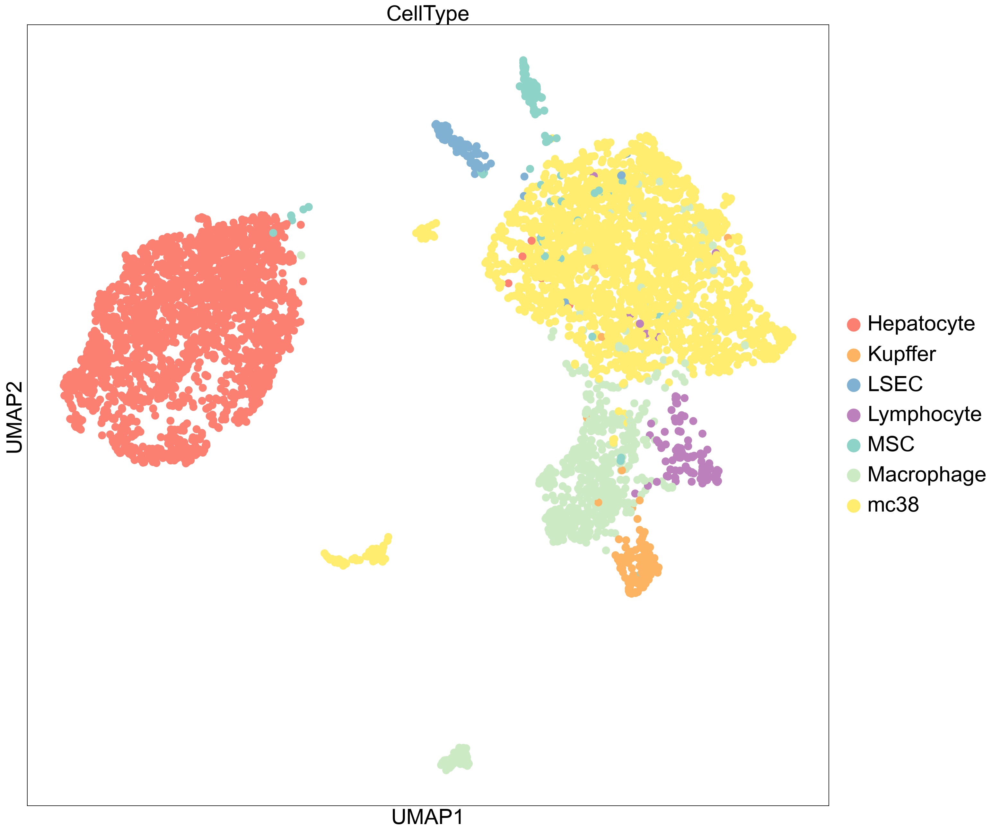

In [148]:
plt.rcParams['figure.figsize'] = [20, 20]



sc.pl.umap(adata_decon,
          color=['CellType'
                ]
           ,
           ncols=2,
          # palette='tab20c_r',
            size=500
          )

In [ ]:
scores = pd.read_csv('/Users/derekbogdanoff/projects/XYZeq/covars.with.smooth.proximity.scores_2.csv',
               header=None,
               names=['index','sample','type1','type2','barcode','num_1','num_2','prox_1','prox_2','bool'],
               index_col=0,
                usecols=['index','prox_1','prox_2']
                     
                    )

In [ ]:
scores.index = scores.index.str.replace(r'_', '.', regex=True)
scores.index = scores.index.str.replace(r'-', '.', regex=True)

In [ ]:
adata_decon = adata_decon[adata_decon.obs.index.isin(scores.index.to_list())]
adata_decon.obs['prox_1']=scores['prox_1']
adata_decon.obs['prox_2']=scores['prox_2']

In [ ]:
plt.rcParams['figure.figsize'] = [20, 20]



sc.pl.umap(adata_decon,
          color=['CellType','prox_2'
                ]
           ,
           ncols=2,
          # palette='tab20c_r',
            size=500
          )

In [ ]:
adata_macro = adata_m[adata_m.obs.CellType == 'Monocyte']

In [ ]:
adata_macro

In [ ]:
sc.pp.neighbors(adata_m, n_neighbors=15, n_pcs=3)
sc.tl.draw_graph(adata_m)

In [ ]:
sc.pl.draw_graph(adata_m,
                 color=['prox_1','prox_2'],
                 legend_loc='on data',
                s=300)